In [1]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from tqdm import tqdm
from omegaconf import OmegaConf
import umap
from models import JointLatentDiffusionNoisyClassifier
from datasets import AdjustedSVHN, AdjustedMNIST, AdjustedFashionMNIST
import torchvision as tv
from ldm.util import default

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

/home/pawel/anaconda3/envs/ldm/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-05-05 18:50:37.985377: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-05 18:50:39.363360: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-05-05 18:50:39.363444: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.

In [2]:
def embed_imgs(model, data_loader):
    # Encode all images in the data_laoder using model, and return both images and encodings
    img_list, embed_list = [], []
    model.eval()
    labels = []
    for imgs, label in tqdm(data_loader):
        imgs = imgs.to(device)
        for i in range(1):
            noise = default(None, lambda: torch.randn_like(imgs))
            t = (torch.ones(len(imgs), dtype=int)*i).to(device)
            x_noisy = model.q_sample(x_start=imgs, t=t, noise=noise)
            with torch.no_grad():
                encoder_posterior = model.encode_first_stage(x_noisy.permute(0, 3, 1, 2))
                latent = model.get_first_stage_encoding(encoder_posterior).detach().flatten(start_dim=1)
            img_list.append(x_noisy.cpu())
            embed_list.append(latent.cpu())
            labels.append(label)
        # if len(img_list) > 1000:
        #     break
    return (torch.cat(img_list, dim=0), torch.cat(embed_list, dim=0), torch.cat(labels, dim=0))

In [3]:
def plot_latent(train_embedded, train_img_embeds, n_data=5000):
    data = pd.DataFrame(train_embedded[:n_data])
    data["label"] = train_img_embeds[2][:n_data].cpu().numpy()
    examples = []
    examples_locations = []
    for i in np.random.randint(0,n_data,40):
        examples.append(train_img_embeds[0][i].squeeze(0).cpu().numpy())
        examples_locations.append(data.iloc[i])
    fig, ax = plt.subplots(figsize=(24, 20))
    # ax.scatter(noises_to_plot_tsne[0],noises_to_plot_tsne[1],c=noises_to_plot_tsne["batch"],s=3,alpha=0.8)
    sns.scatterplot(
        x=0, y=1,
        hue="label",
        palette=sns.color_palette("hls", 10),
        data=data,
        legend="full",
        # alpha=0.1
    )
    for location, example in zip(examples_locations, examples):
        x, y = location[0], location[1]
        label = int(location["label"])
        ab = AnnotationBbox(OffsetImage(example,cmap=plt.cm.gray_r, zoom=1), (x, y), frameon=True,
                            bboxprops=dict(facecolor=sns.color_palette("hls", 10)[label], boxstyle="round"))
        ax.add_artist(ab)
    plt.show()

In [9]:
def plot_samples(train_embedded, train_img_embeds, model, umap_object, labels, grad_scales, batch=64,  n_data=5000):
    data = pd.DataFrame(train_embedded[:n_data])
    data["label"] = train_img_embeds[2][:n_data].cpu().numpy()
    fig, ax = plt.subplots(len(labels), len(grad_scales), figsize=(24, 60))

    for i, label in enumerate(labels):
        for j, scale in enumerate(grad_scales):
            
            model.sample_classes = torch.ones(batch, dtype=int).to(device) * label
            model.sample_grad_scale = scale
            samples = model.sample(None, batch_size=batch)
            samples_flattened = samples.flatten(start_dim=1).cpu()

            samples_emb = umap_object.transform(samples_flattened)

            sns.scatterplot(
                x=0, y=1,
                hue="label",
                palette=sns.color_palette("hls", 10),
                data=data,
                legend="full",
                size=2,
                # alpha=0.1,
                ax=ax[i, j]
            )
            ax[i, j].scatter(
                samples_emb[:, 0],
                samples_emb[:, 1],
                color="black",
                size=2,
            )
    plt.show()

# FashionMNIST

In [5]:
config = OmegaConf.load("configs/fashion-joint-diffusion.yaml")
config.model.params["ckpt_path"] = f"logs/JointDiffusion_2023-04-24T22-09-09/checkpoints/last.ckpt"
model = JointLatentDiffusionNoisyClassifier(**config.model.get("params", dict()))

model.to(device)

dataset = AdjustedFashionMNIST(train=True)
dl = torch.utils.data.DataLoader(dataset, batch_size=128)

JointLatentDiffusionNoisyClassifier: Running in eps-prediction mode
DiffusionWrapper has 67.45 M params.
Keeping EMAs of 308.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 8, 8) = 256 dimensions.
making attention of type 'vanilla' with 512 in_channels
Restored from logs/Autoencoder_2023-04-22T19-21-23/checkpoints/last.ckpt
Training JointLatentDiffusionNoisyClassifier as an unconditional model.
Restored from logs/JointDiffusion_2023-04-24T22-09-09/checkpoints/last.ckpt with 0 missing and 4 unexpected keys
Unexpected Keys: ['classifier.0.weight', 'classifier.0.bias', 'classifier.4.weight', 'classifier.4.bias']
Restored from logs/JointDiffusion_2023-04-24T22-09-09/checkpoints/last.ckpt with 0 missing and 0 unexpected keys


In [6]:
train_img_embeds = embed_imgs(model, dl)

100%|██████████| 469/469 [00:48<00:00,  9.64it/s]


In [7]:
umap_object = umap.UMAP(metric="cosine", n_neighbors=100) # tym się pobawić
train_embedded = umap_object.fit_transform(train_img_embeds[1].cpu()) # tu dać  też zaszumione obrazy tak z 10 na 1 normalny

Sampling t: 100%|██████████| 1000/1000 [01:49<00:00,  9.16it/s]


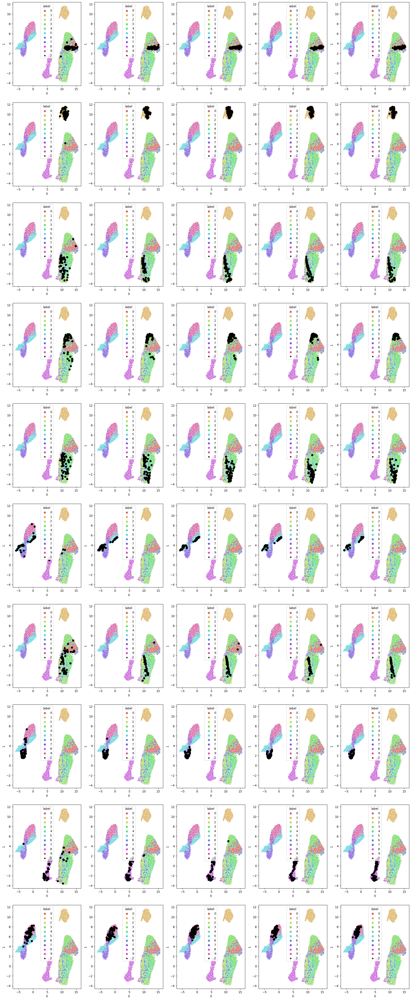

In [10]:
plot_samples(train_embedded=train_embedded, train_img_embeds=train_img_embeds, model=model, umap_object=umap_object, labels=range(10), grad_scales=range(30, 330, 60), batch=64, n_data=60000)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

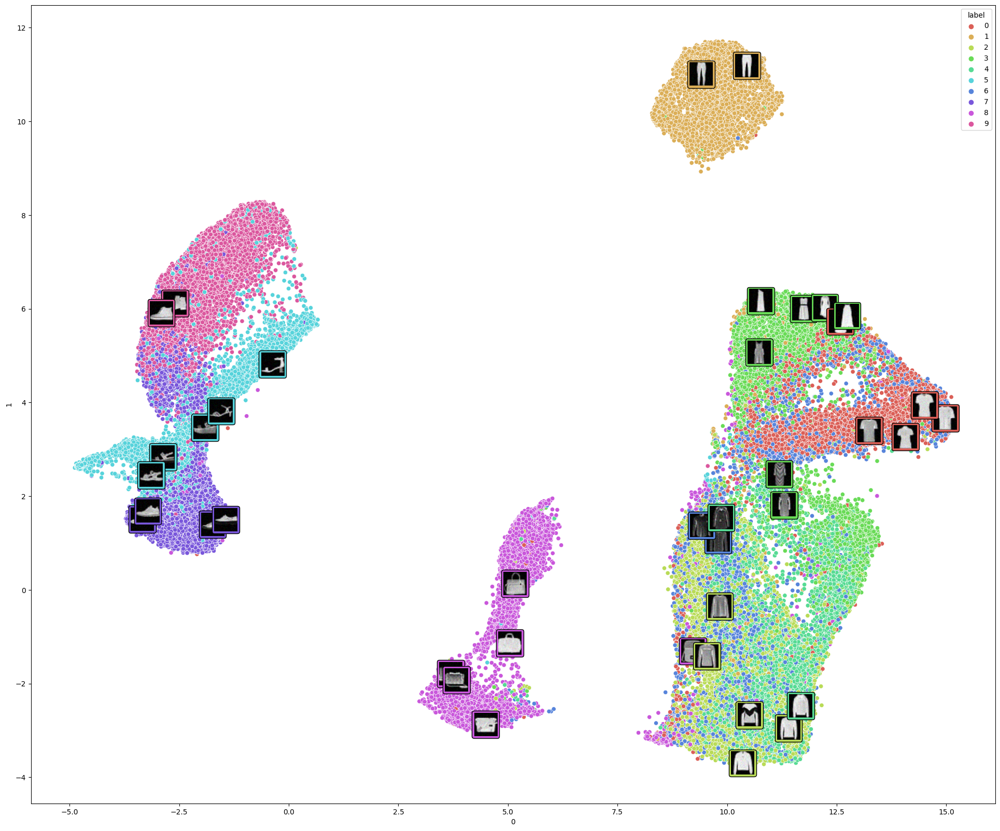

In [9]:
plot_latent(train_embedded, train_img_embeds, 60000)

In [10]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device)
model.sample_grad_scale = 30
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:09<00:00, 14.34it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


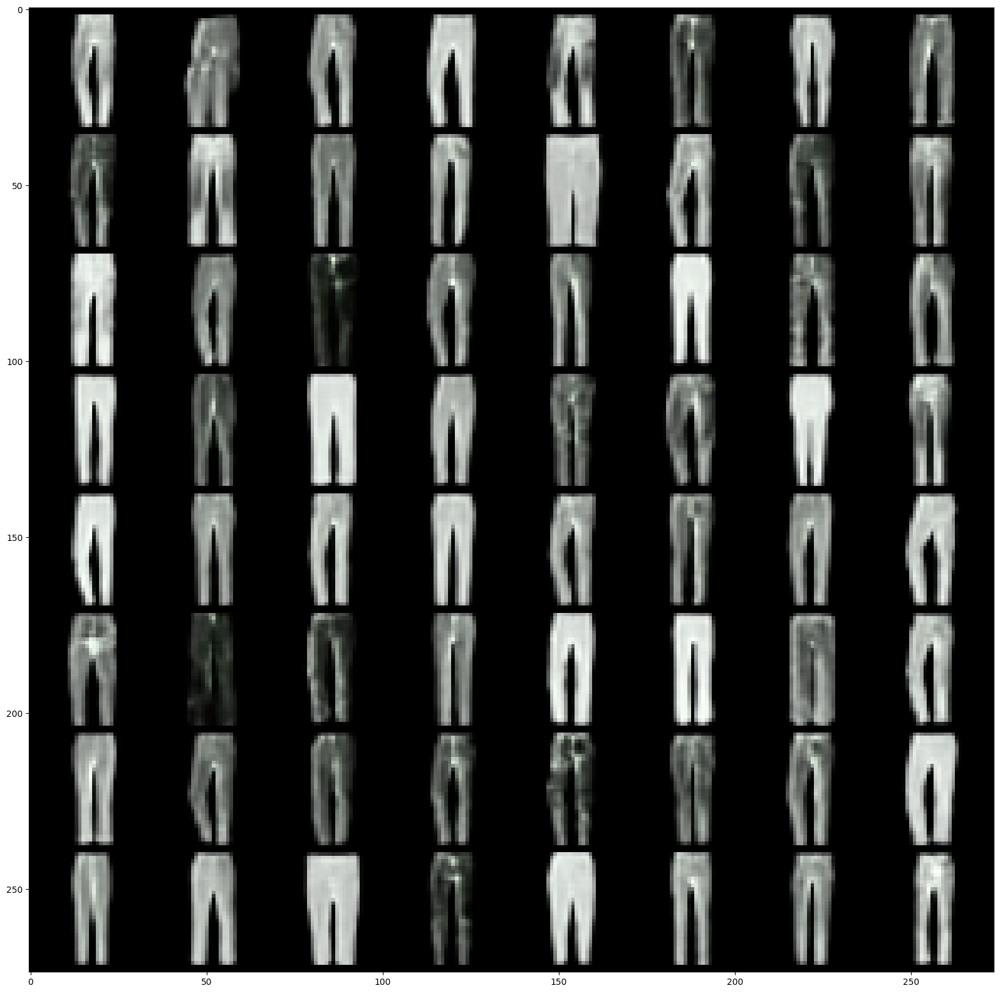

In [22]:
fig, ax = plt.subplots(figsize=(24, 20))
samples_imgs = model.decode_first_stage(samples.to(model.device))
grid = tv.utils.make_grid(samples_imgs.cpu())
plt.imshow(grid.permute(1,2,0))
plt.show()

In [23]:
samples_emb = umap_object.transform(samples_flattened)

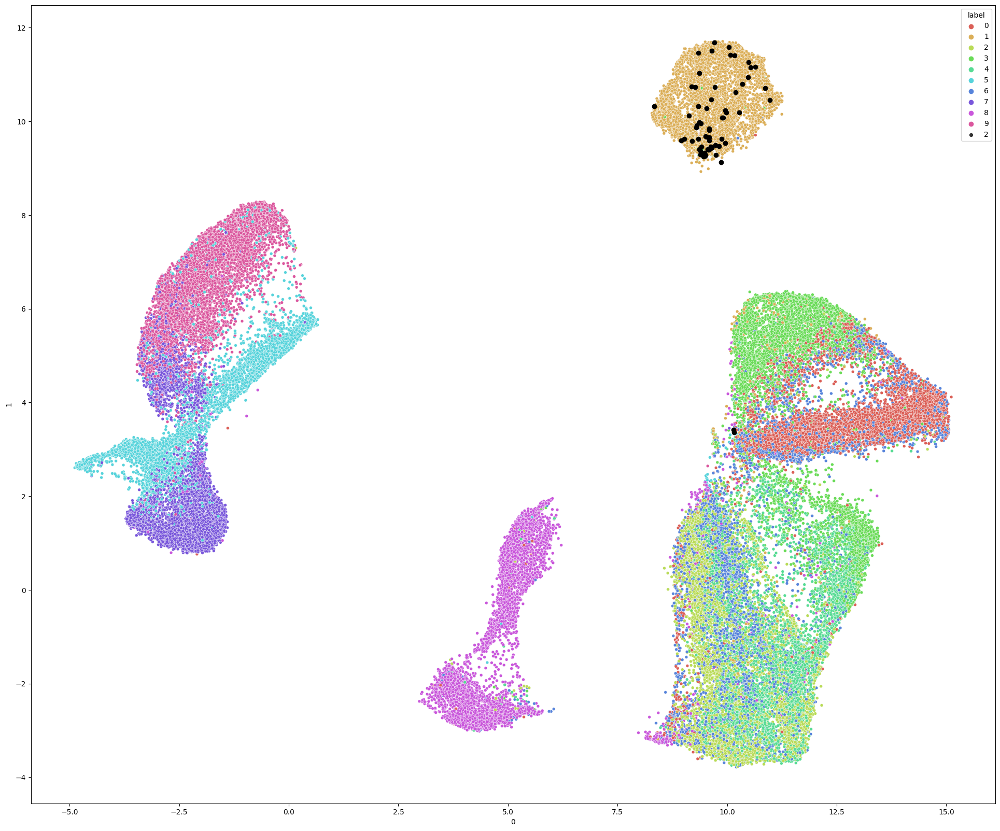

In [24]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)

In [25]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device)
model.sample_grad_scale = 60
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:10<00:00, 14.15it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


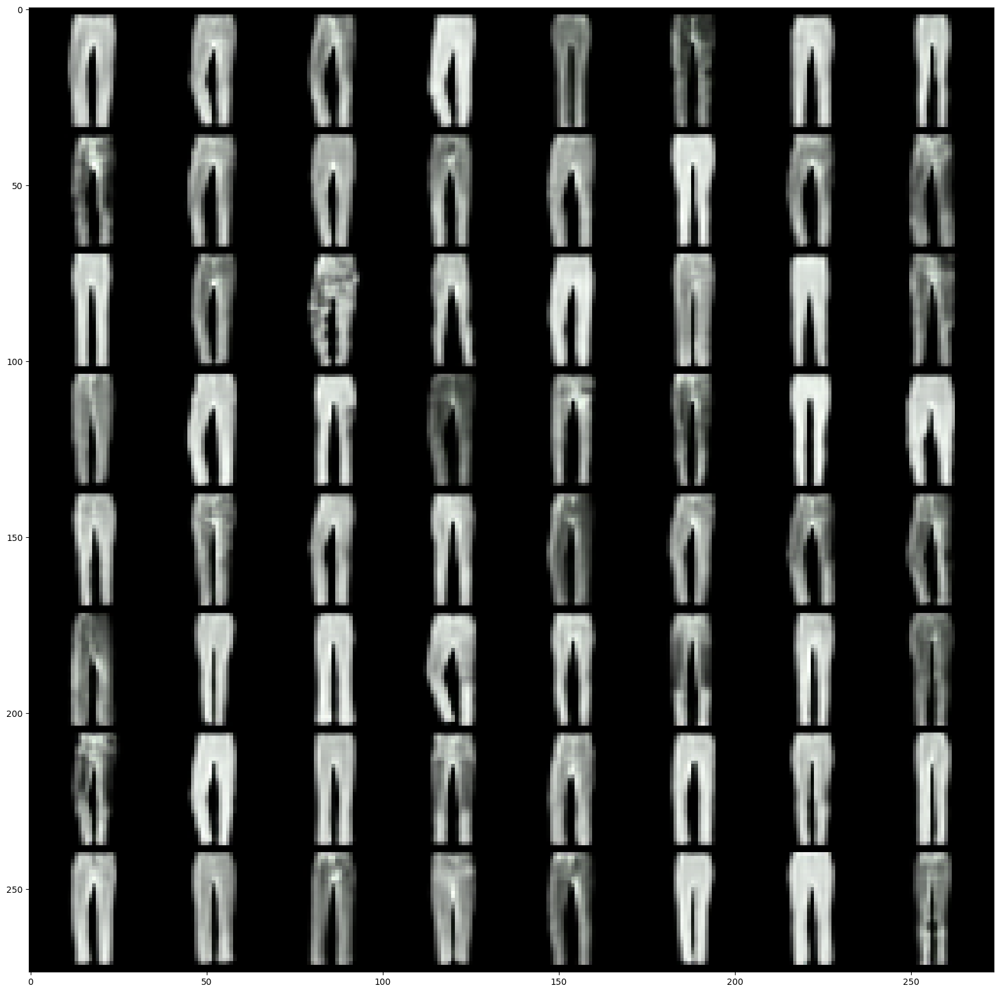

In [26]:
fig, ax = plt.subplots(figsize=(24, 20))
samples_imgs = model.decode_first_stage(samples.to(model.device))
grid = tv.utils.make_grid(samples_imgs.cpu())
plt.imshow(grid.permute(1,2,0))
plt.show()

In [27]:
samples_emb = umap_object.transform(samples_flattened)

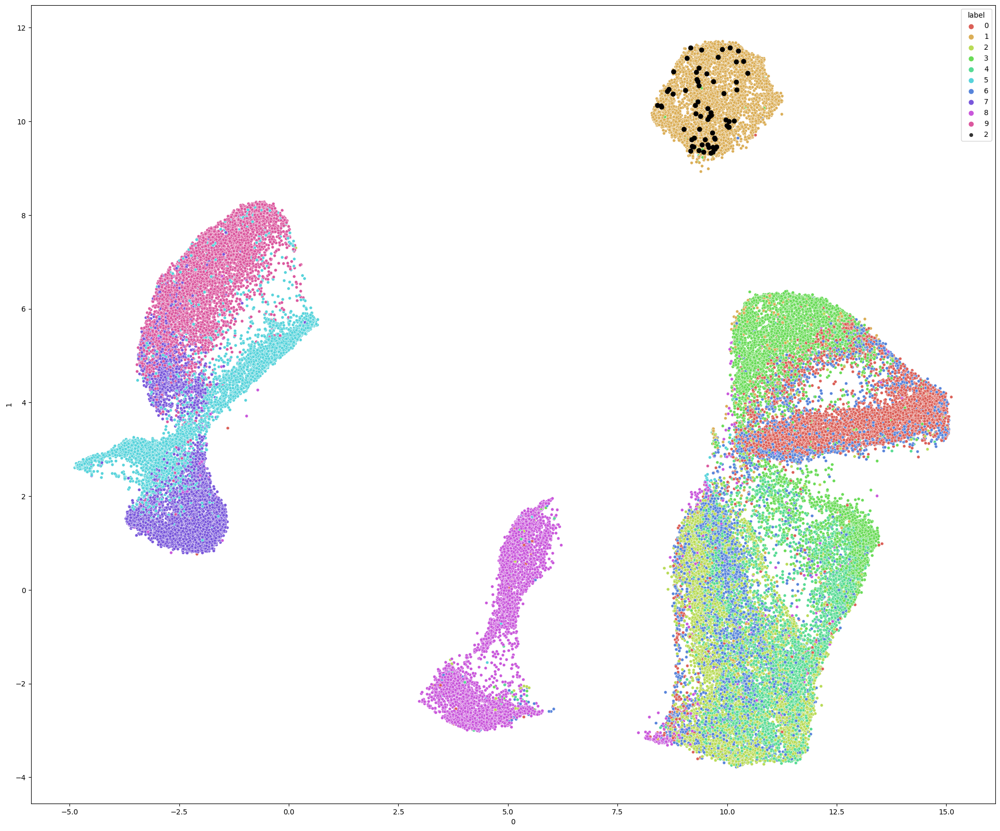

In [28]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)

In [29]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device)
model.sample_grad_scale = 100
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:18<00:00, 12.79it/s]


In [30]:
samples_emb = umap_object.transform(samples_flattened)

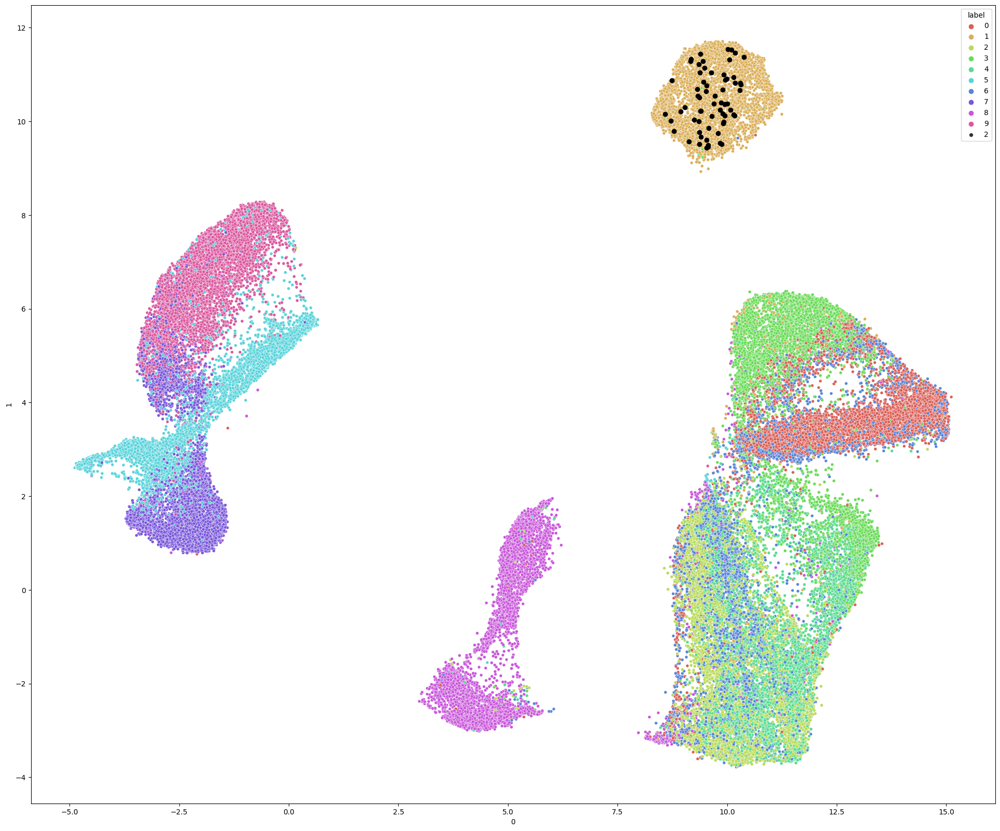

In [31]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)

In [32]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device)
model.sample_grad_scale = 200
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:22<00:00, 12.06it/s]


In [33]:
samples_emb = umap_object.transform(samples_flattened)

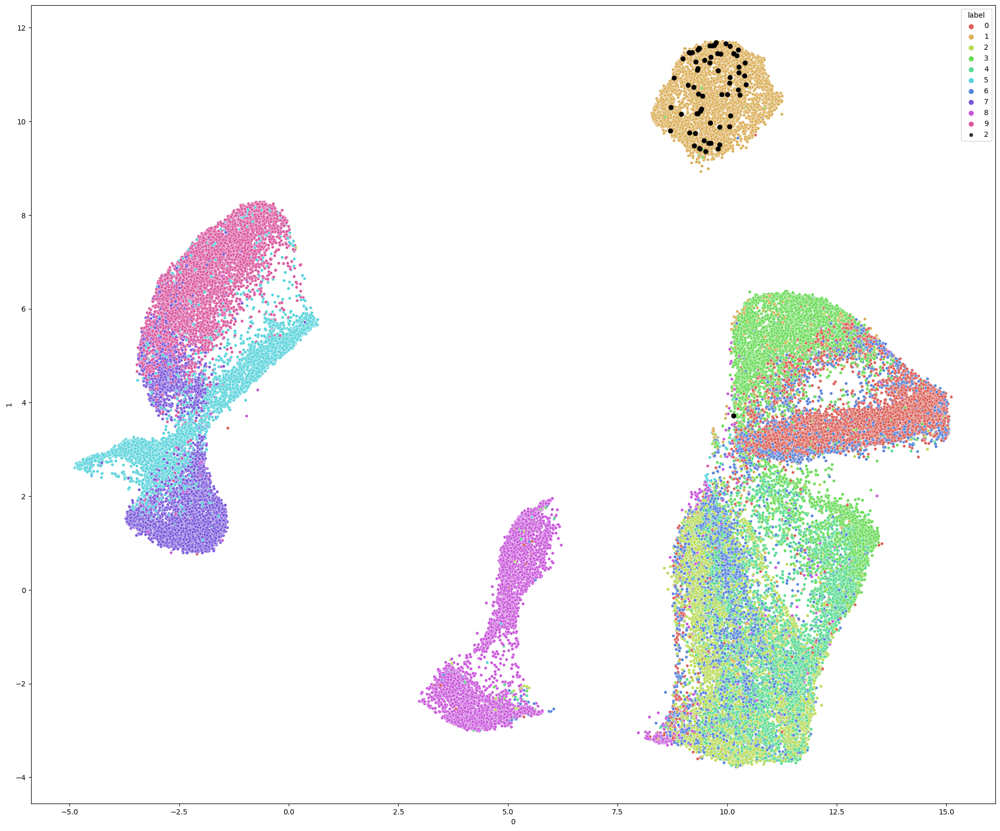

In [34]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


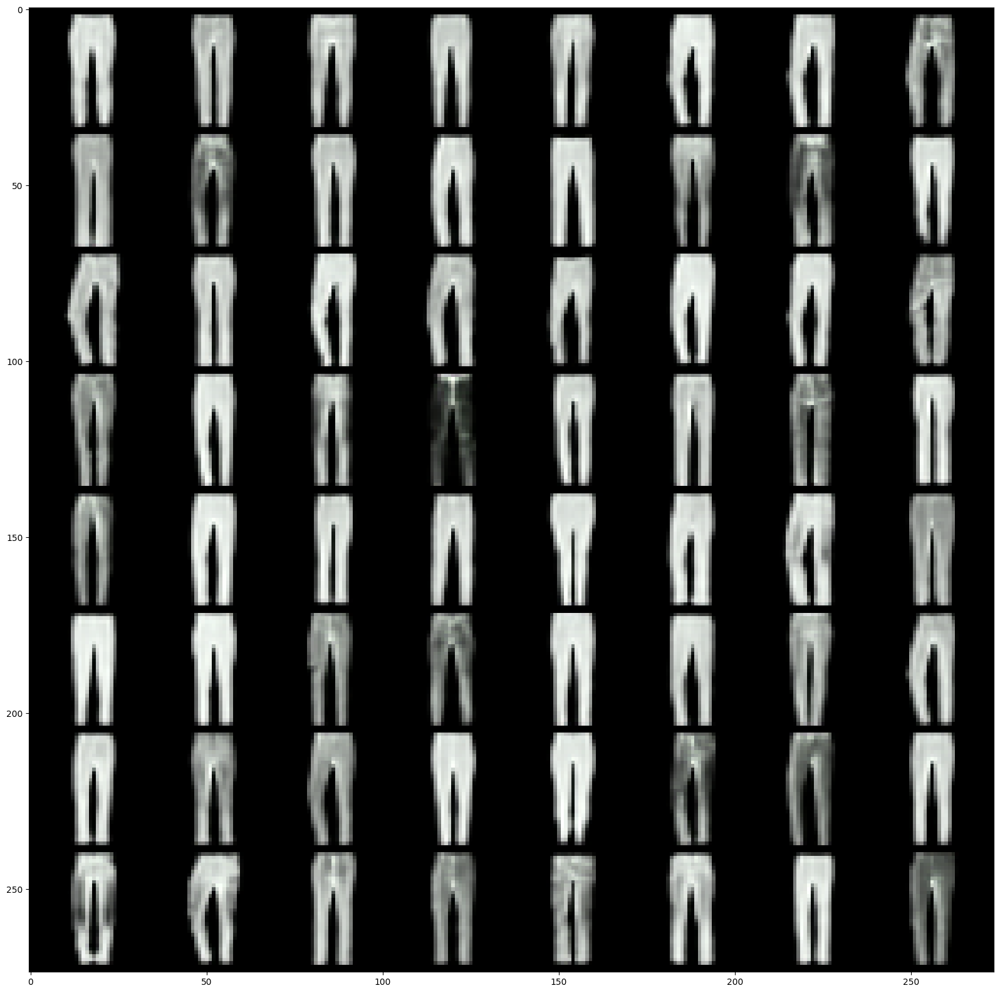

In [35]:
fig, ax = plt.subplots(figsize=(24, 20))
samples_imgs = model.decode_first_stage(samples.to(model.device))
grid = tv.utils.make_grid(samples_imgs.cpu())
plt.imshow(grid.permute(1,2,0))
plt.show()

## Class 2

In [36]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device) * 8
model.sample_grad_scale = 30
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:27<00:00, 11.47it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


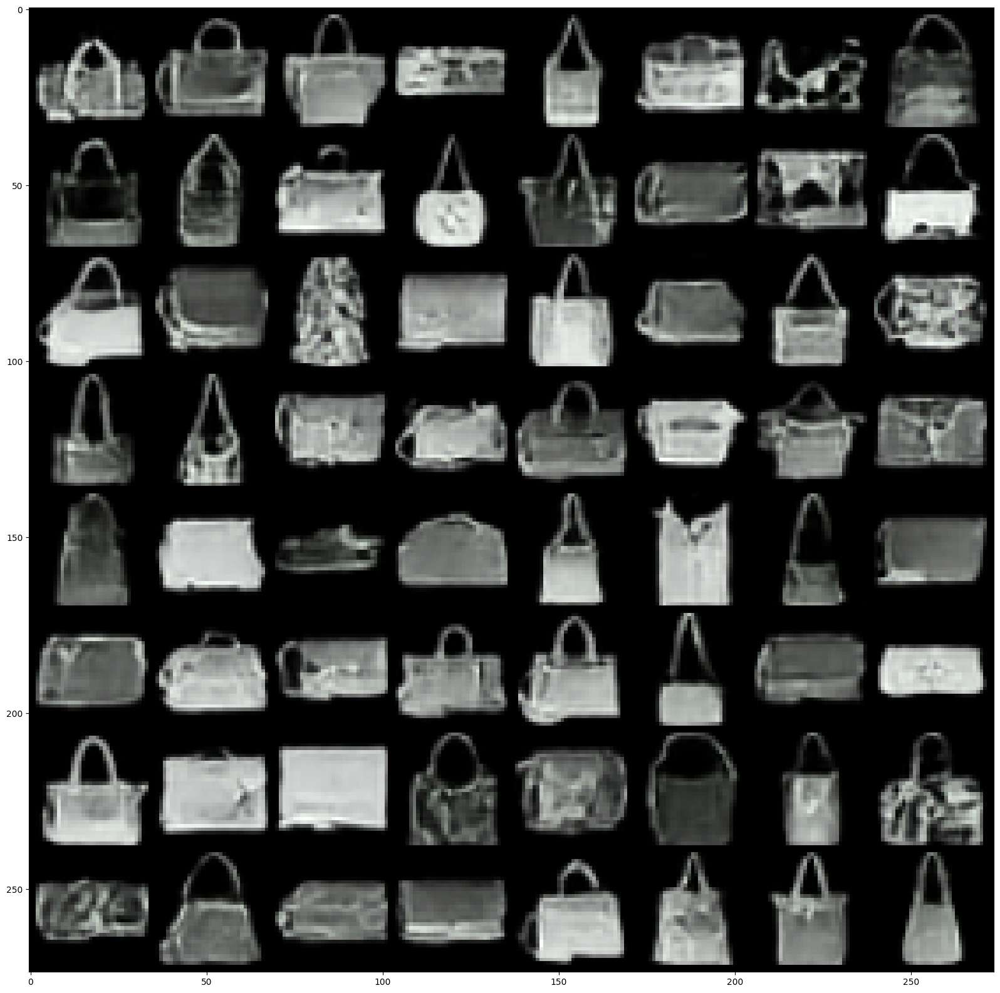

In [37]:
fig, ax = plt.subplots(figsize=(24, 20))
samples_imgs = model.decode_first_stage(samples.to(model.device))
grid = tv.utils.make_grid(samples_imgs.cpu())
plt.imshow(grid.permute(1,2,0))
plt.show()

In [38]:
samples_emb = umap_object.transform(samples_flattened)

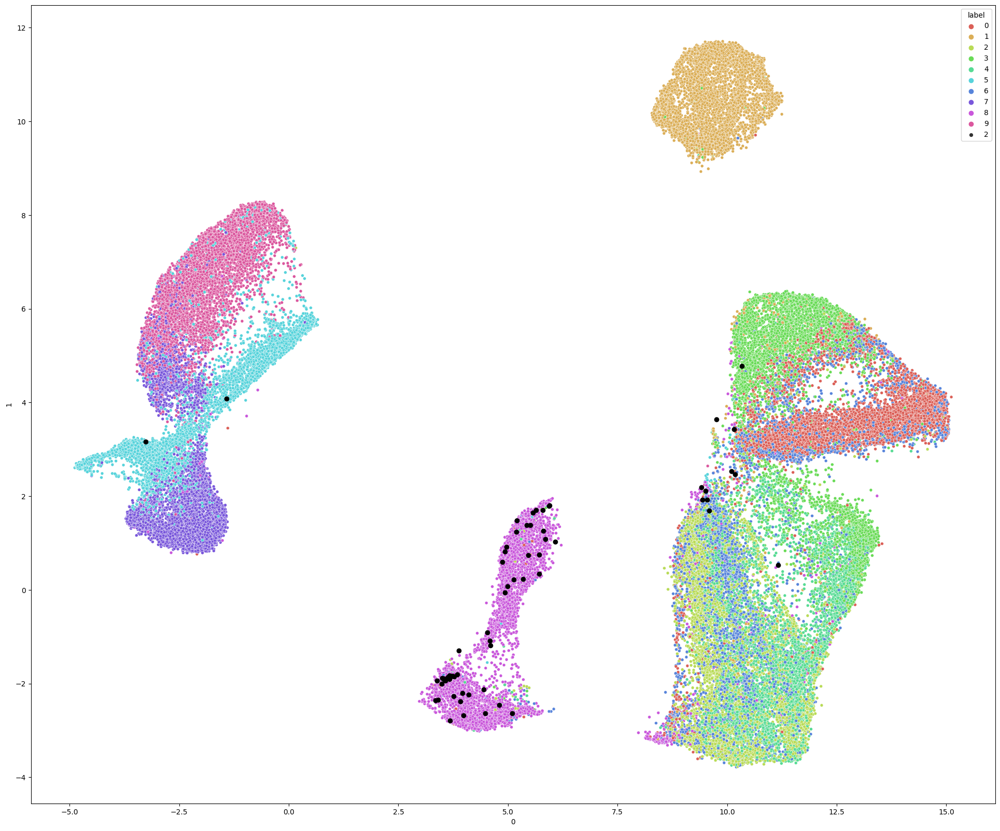

In [39]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)

In [40]:
batch_size = 64
model.sample_classes = torch.ones(batch_size, dtype=int).to(device) * 8
model.sample_grad_scale = 100
samples = model.sample(None, batch_size=batch_size)
samples_flattened = samples.flatten(start_dim=1).cpu()

Sampling t: 100%|██████████| 1000/1000 [01:29<00:00, 11.13it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


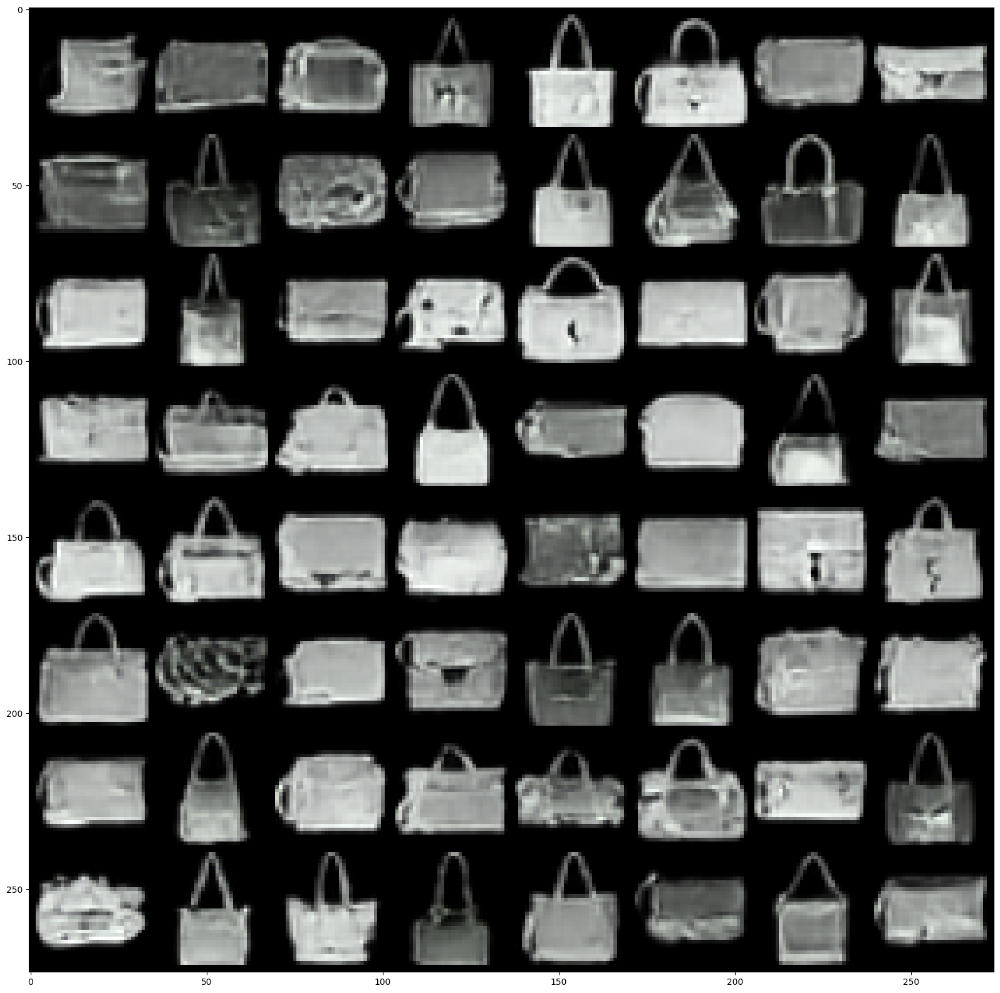

In [41]:
fig, ax = plt.subplots(figsize=(24, 20))
samples_imgs = model.decode_first_stage(samples.to(model.device))
grid = tv.utils.make_grid(samples_imgs.cpu())
plt.imshow(grid.permute(1,2,0))
plt.show()

In [42]:
samples_emb = umap_object.transform(samples_flattened)

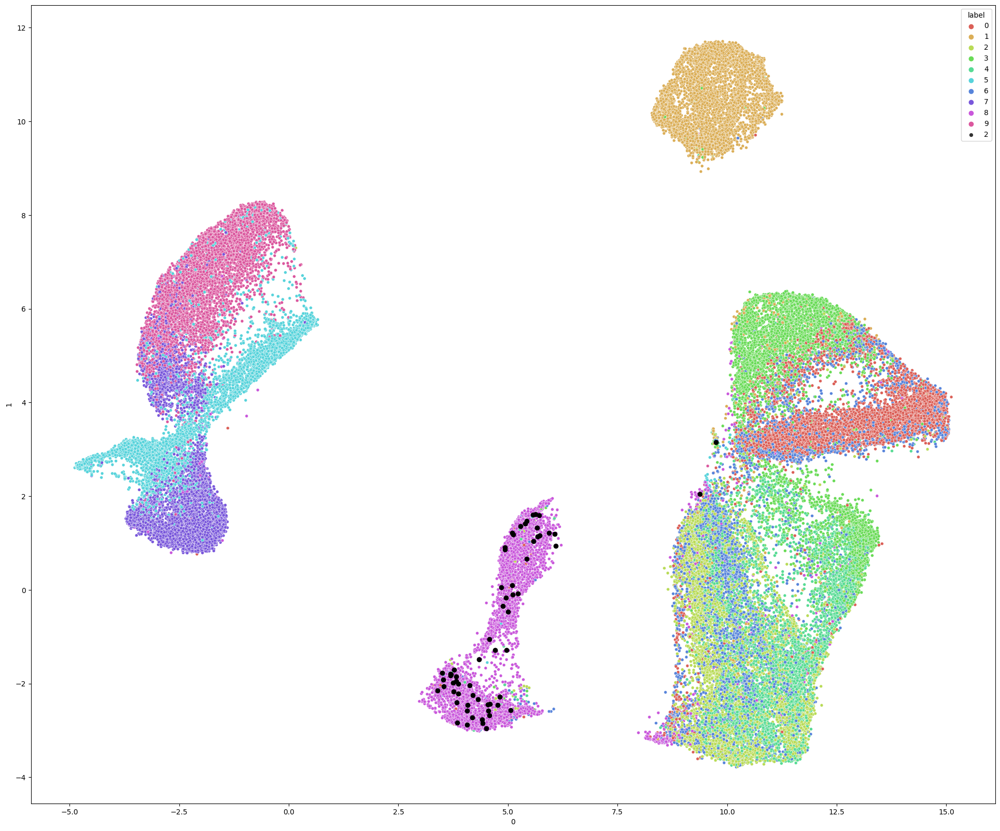

In [43]:
plot_samples(train_embedded, train_img_embeds, samples_emb, 60000)